In [2]:
import pickle

import matplotlib.pyplot as plt
from matplotlib import collections as mc
import numpy as np
import sklearn
from sklearn import linear_model
import torch

import sys
sys.path.append('..')

from latent_actions.cvae.cvae import ConditionalVAE
from latent_actions.envs.panda_center_out import PandaCenterOutEnv

In [33]:
with open('../data/demonstration_3d_center_out.pkl', 'rb') as fp:
    episodes = pickle.load(fp)

In [38]:
env = PandaCenterOutEnv(render=False, dimension=3, control_type='ee')

# Enumerate the goals

goals = set()

while len(goals) != 26:
    obs = env.reset()
    goals.add(tuple(obs['desired_goal']))
    
goals = sorted(list(goals), key=lambda g: (-g[2], -g[1], g[0]))

neutral_ee_position = obs['achieved_goal']
neutral_joint_angles = np.array([env.robot.get_joint_angle(i) for i in range(10)])

# Enumerate the joint angles for each goal

joint_angles_at_goals = []

for goal in goals:
    while tuple(env._get_obs()['desired_goal']) != goal:
        obs = env.reset()
    
    is_success = False
    while not is_success:
        a = obs['desired_goal'] - obs['achieved_goal']
        obs, _, _, info = env.step(a)
        is_success = info['is_success']
        
    joint_angles = np.array([env.robot.get_joint_angle(i) for i in range(10)])
    joint_angles_at_goals.append(joint_angles)

In [40]:
actions_joints = np.array([step['action_joints'] for epi in episodes for step in epi])

In [41]:
env = PandaCenterOutEnv(render=False, dimension=3, control_type='joints')

In [42]:
def visualize_encoder(decoder):
    actions_joints_test = np.array([(step['action_joints'], step['previous_joint_angles']) for epi in episodes for step in epi]) 
    actions_joints_test = actions_joints_test.reshape(actions_joints_test.shape[0], -1)

    x = decoder.encoder(torch.tensor(actions_joints_test, dtype=torch.float))
    mu = decoder.fc_mu(x).detach().numpy()
    log_var = decoder.fc_var(x)
    std = torch.exp(log_var / 2).detach().numpy()

    std_x = std.copy()
    std_x[:, 1] = 0
    std_y = std.copy()
    std_y[:, 0] = 0

    horizontal_lines = list(zip(mu-std_x, mu+std_x))
    vertical_lines = list(zip(mu-std_y, mu+std_y))

    hlc = mc.LineCollection(horizontal_lines, linewidths=0.01)
    vlc = mc.LineCollection(vertical_lines, linewidths=0.01)
    
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.add_collection(hlc)
    ax.add_collection(vlc)
    ax.autoscale()
    ax.margins(0.1)
    ax.scatter(mu[:, 0], mu[:, 1])
    ax.set_title('mean and variance of encoder')
    
    plt.show()

In [43]:
def get_latent_bounds(decoder):
    actions_joints_test = np.array([(step['action_joints'], step['previous_joint_angles']) for epi in episodes for step in epi]) 
    actions_joints_test = actions_joints_test.reshape(actions_joints_test.shape[0], -1)

    x = decoder.encoder(torch.tensor(actions_joints_test, dtype=torch.float))
    mu = decoder.fc_mu(x).detach().numpy()
    log_var = decoder.fc_var(x)
    std = torch.exp(log_var / 2).detach().numpy()

    return {
        'x_min': min((mu - std)[:, 0]), 
        'x_max': max((mu + std)[:, 0]), 
        'y_min': min((mu - std)[:, 1]), 
        'y_max': max((mu + std)[:, 1])}

In [54]:
def visualize_decoder(decoder, x_min, x_max, y_min, y_max, subtract_neutral_from_context = False):
    x, y = np.meshgrid(
        np.arange(x_min, x_max, (x_max - x_min) / 20), 
        np.arange(y_min, y_max, (y_max - y_min) / 20))
    latents = torch.tensor(list(zip(x.reshape(-1), y.reshape(-1))), dtype=torch.float)

    fig, axs = plt.subplots(9, 3, figsize=(20, 20))

    for i, (goal, joint_angles) in enumerate(zip(goals, joint_angles_at_goals)):
        if i >= 13:
            i += 1 # offset for visualization

        contexts = torch.tensor(np.stack([joint_angles[:7]] * latents.shape[0]), dtype=torch.float)
        if subtract_neutral_from_context:
            contexts -= torch.tensor(neutral_joint_angles[:7])
        actions_joints = decoder(latent=latents, context=contexts).detach().numpy()
        axs[i // 3, i % 3].imshow(np.concatenate([actions_joints[:, i].reshape(20, 20) for i in range(7)], axis=1))
        axs[i // 3, i % 3].set_title(goal)

    contexts = torch.tensor(np.stack([neutral_joint_angles[:7]] * latents.shape[0]), dtype=torch.float)
    if subtract_neutral_from_context:
        contexts -= torch.tensor(neutral_joint_angles[:7])
    actions_joints = decoder(latent=latents, context=contexts).detach().numpy()
    axs[4, 1].imshow(np.concatenate([actions_joints[:, i].reshape(20, 20) for i in range(7)], axis=1))

In [58]:
def visualize_decoder_forward_kinematics(decoder, x_min, x_max, y_min, y_max, subtract_neutral_from_context = False):
    x, y = np.meshgrid(
        np.arange(x_min, x_max, (x_max - x_min) / 20), 
        np.arange(y_min, y_max, (y_max - y_min) / 20))
    latents = torch.tensor(list(zip(x.reshape(-1), y.reshape(-1))), dtype=torch.float)
    
    fig, axs = plt.subplots(9, 3, figsize=(20, 60))

    for i, (goal, joint_angles) in enumerate(zip(goals, joint_angles_at_goals)):
        if i >= 13:
            i += 1 # offset for visualization

        contexts = torch.tensor(np.stack([joint_angles[:7]] * latents.shape[0]), dtype=torch.float)
        if subtract_neutral_from_context:
            contexts -= torch.tensor(neutral_joint_angles[:7])
        actions_joints = decoder(latent=latents, context=contexts).detach().numpy()

        actions_ee = []
        env.robot.set_joint_angles(joint_angles)
        current_ee_position = env._get_obs()['achieved_goal']

        for action_joints in actions_joints:
            obs, _, _, _ = env.step(action_joints)
            actions_ee.append(obs['achieved_goal'] - current_ee_position)
            env.robot.set_joint_angles(joint_angles)

        actions_ee = np.array(actions_ee)
        axs[i // 3, i % 3].quiver(x, y, actions_ee[:, 0], actions_ee[:, 1])
        axs[i // 3, i % 3].set_title(goal[:2])

    actions_ee = []
    env.reset()

    contexts = torch.tensor(np.stack([neutral_joint_angles[:7]] * latents.shape[0]), dtype=torch.float)
    if subtract_neutral_from_context:
        contexts -= torch.tensor(neutral_joint_angles[:7])
    actions_joints = decoder(latent=latents, context=contexts).detach().numpy()

    for action_joints in actions_joints:
        obs, _, _, _ = env.step(action_joints)
        actions_ee.append(obs['achieved_goal'] - neutral_ee_position)
        env.reset()

    actions_ee = np.array(actions_ee)
    axs[4, 1].quiver(x, y, actions_ee[:, 0], actions_ee[:, 1])
    
    plt.show()

In [47]:
def offline_evaluation(decoder, subtract_neutral_from_context = False):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(projection='3d')

    for episode in episodes[:100]:
        ee_positions_ground_truth = np.array(
            [step['previous_observation']['achieved_goal'] for step in episode])
        ax.scatter(
            ee_positions_ground_truth[:, 0], 
            ee_positions_ground_truth[:, 1], 
            ee_positions_ground_truth[:, 2], 
            color='r')

        obs = env.reset()

        ee_positions_predicted = []
        for step in episode:
            context = torch.tensor(step['previous_joint_angles'], dtype=torch.float)
            if subtract_neutral_from_context:
                context -= torch.tensor(neutral_joint_angles[:7])
            z = decoder.encoder(
                torch.cat((
                    torch.tensor(step['action_joints'], dtype=torch.float), 
                    context))).reshape(1, -1)
            z = decoder.fc_mu(z)
            joint_action = decoder(
                latent=z, 
                context=context.reshape(1, -1))
            obs, _, _, _ = env.step(joint_action.detach().numpy().squeeze())
            ee_positions_predicted.append(obs['achieved_goal'])

        ee_positions_predicted = np.array(ee_positions_predicted)
        ax.scatter(
            ee_positions_predicted[:, 0], 
            ee_positions_predicted[:, 1], 
            ee_positions_predicted[:, 2], 
            color='b')

    plt.show()

## fine-meadow-453
KL = 0

In [75]:
decoder = ConditionalVAE.load_from_checkpoint('../latent-action/3o45pw8k/checkpoints/epoch=399-step=999999.ckpt')

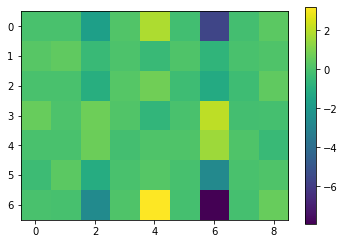

In [76]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

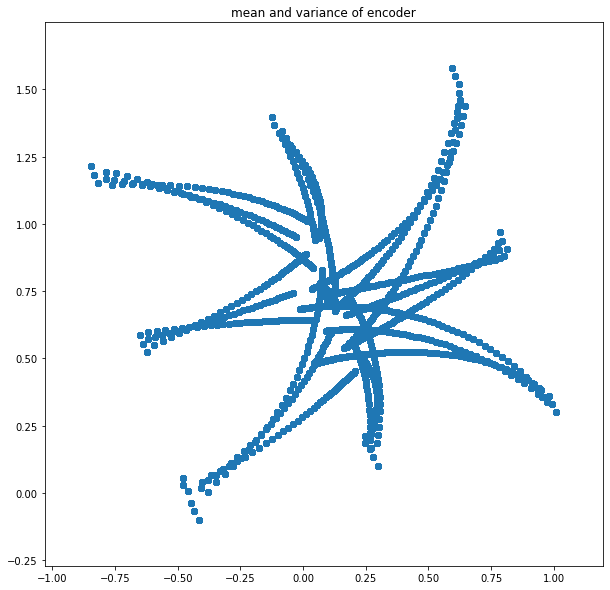

In [77]:
visualize_encoder(decoder)

{'x_min': -0.84414613, 'x_max': 1.0096186, 'y_min': -0.10150471, 'y_max': 1.5804573}


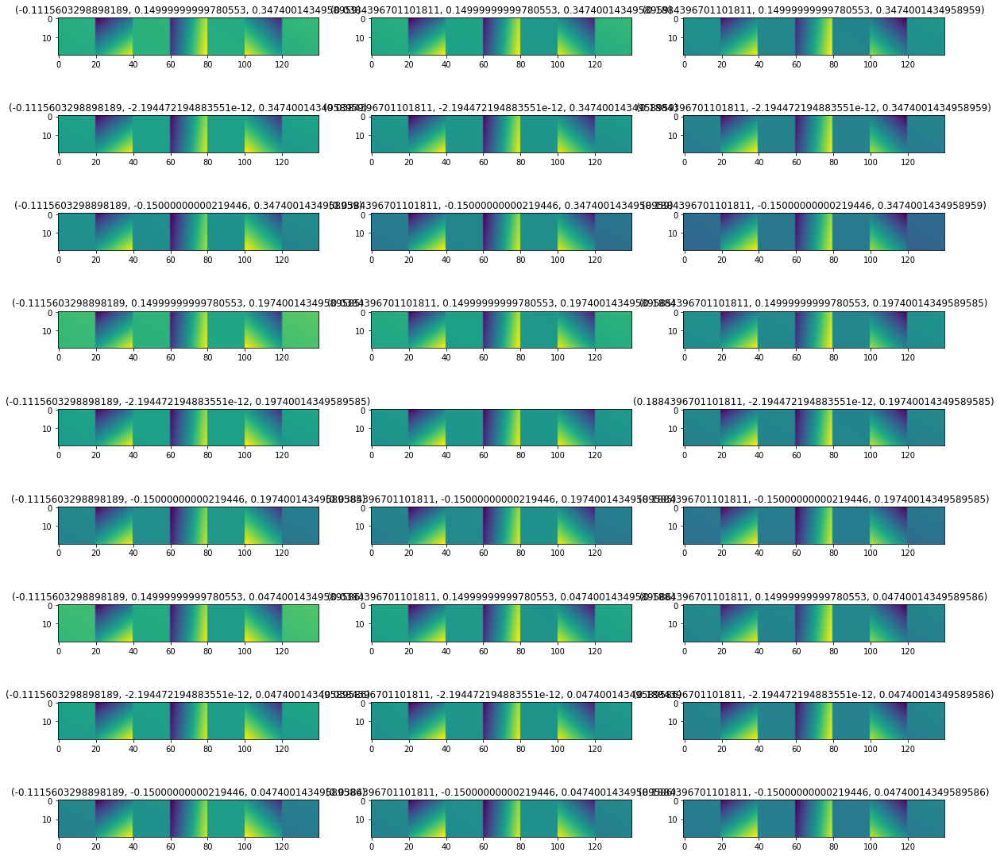

In [78]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

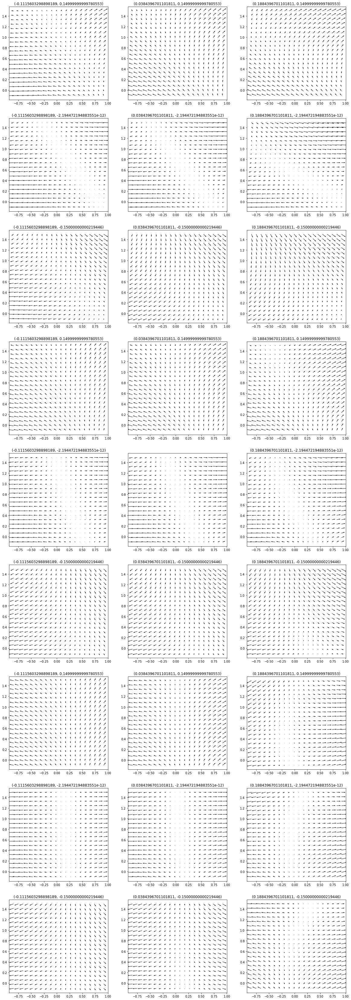

In [79]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

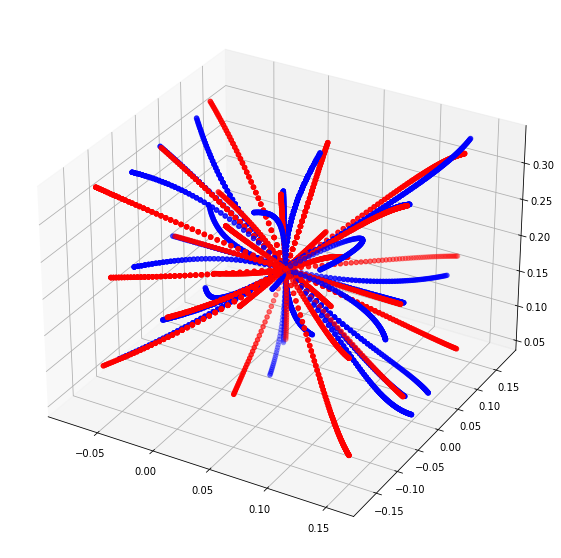

In [80]:
offline_evaluation(decoder)

## morning-durian-454

KL = 0.0001

In [81]:
decoder = ConditionalVAE.load_from_checkpoint('../latent-action/3f7gp8uo/checkpoints/epoch=399-step=999999.ckpt')

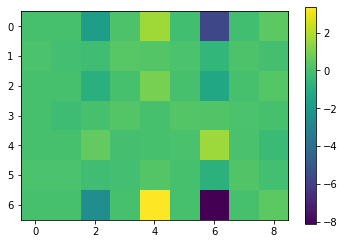

In [82]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

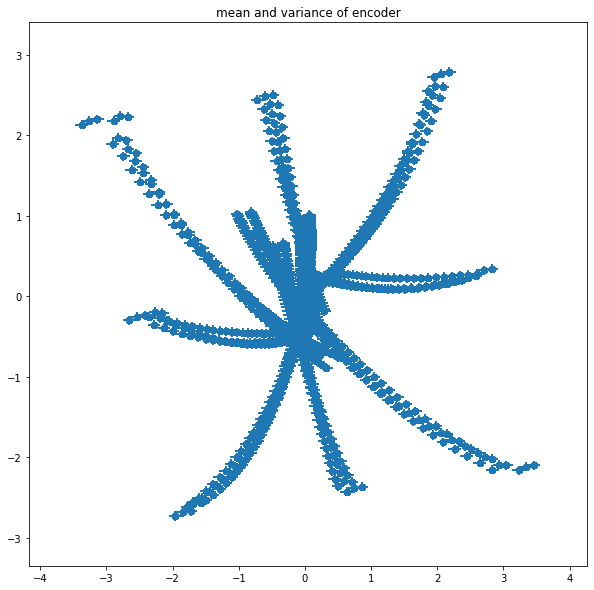

In [83]:
visualize_encoder(decoder)

{'x_min': -3.4681754, 'x_max': 3.5585017, 'y_min': -2.7833025, 'y_max': 2.8425598}


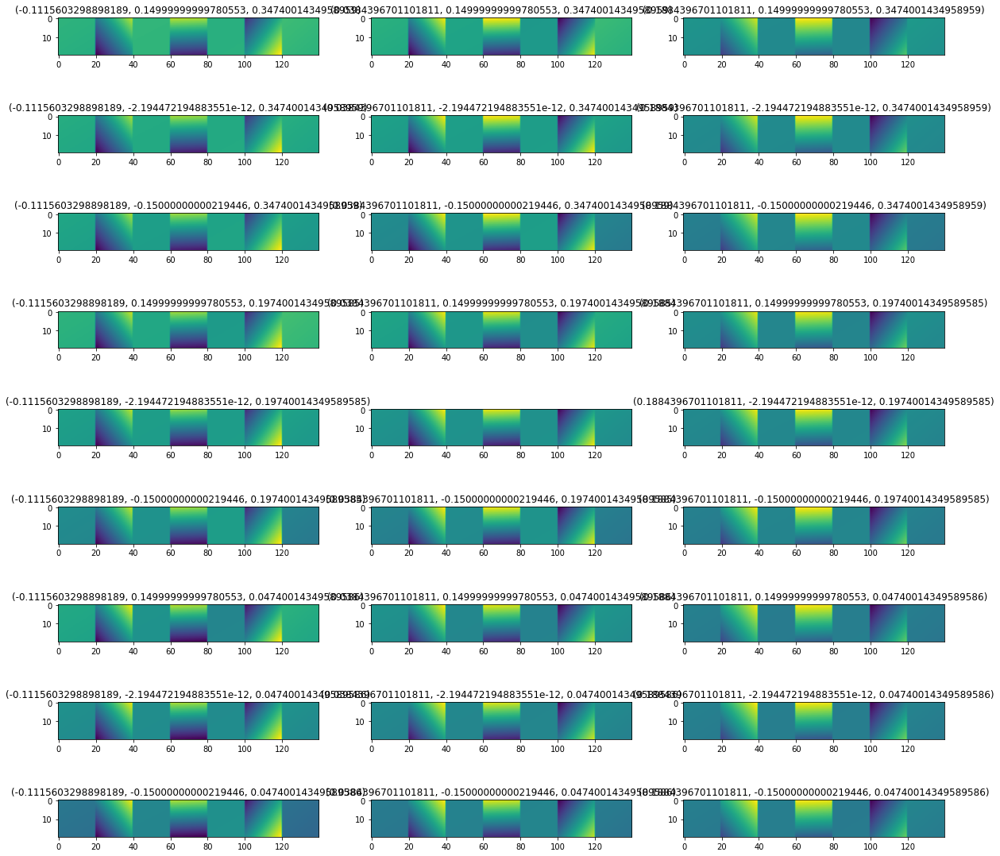

In [84]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

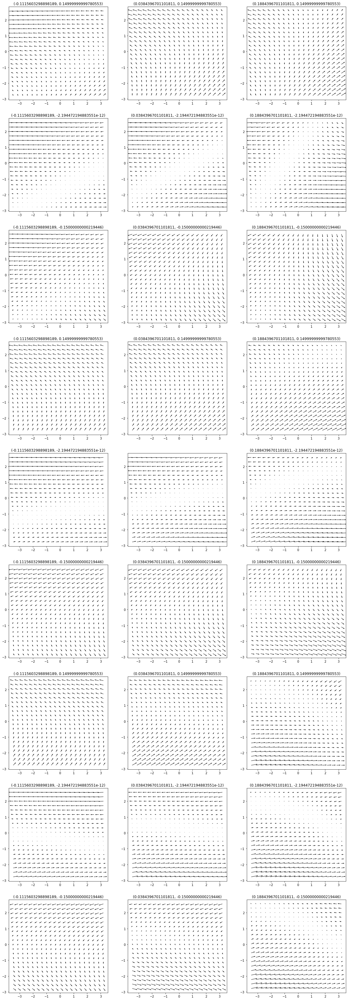

In [85]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

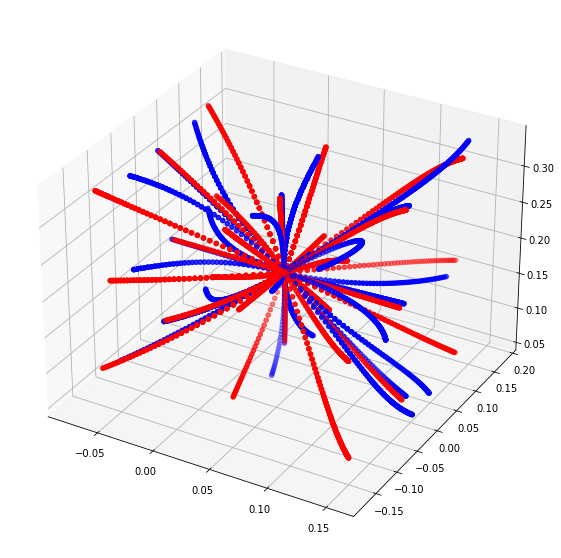

In [86]:
offline_evaluation(decoder)

## stilted-energy-455

KL = 0.001

In [87]:
decoder = ConditionalVAE.load_from_checkpoint('../latent-action/2ttz9o7u/checkpoints/epoch=399-step=999999.ckpt')

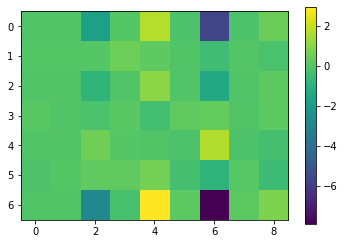

In [88]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

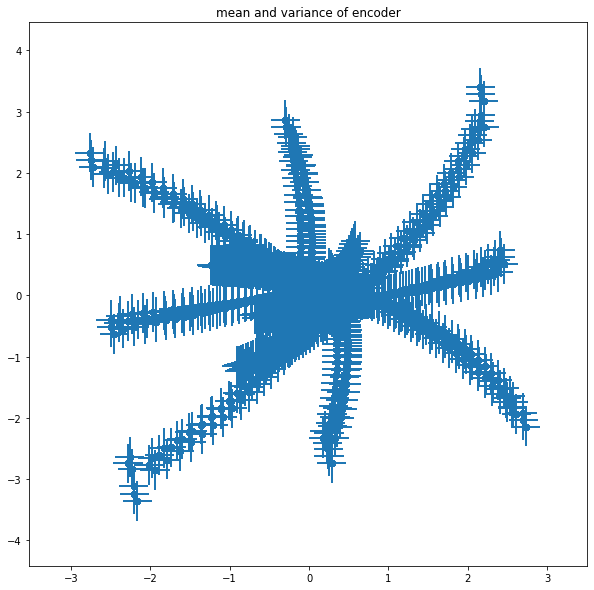

In [89]:
visualize_encoder(decoder)

{'x_min': -2.9439495, 'x_max': 2.914414, 'y_min': -3.6790652, 'y_max': 3.7214427}


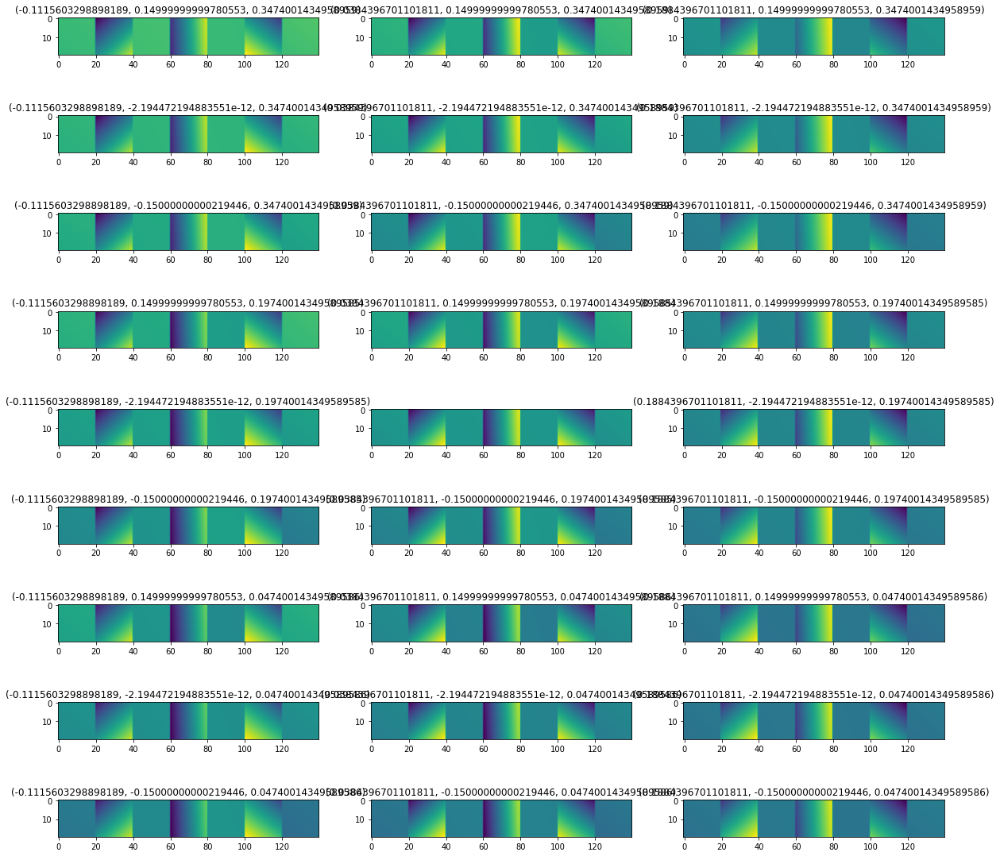

In [90]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

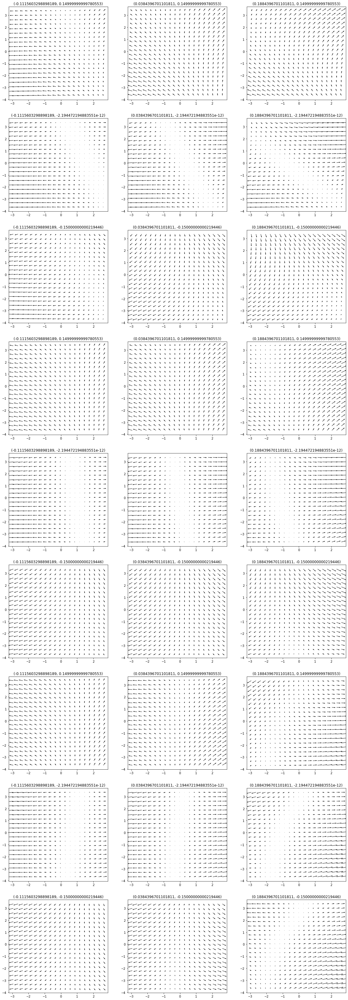

In [91]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

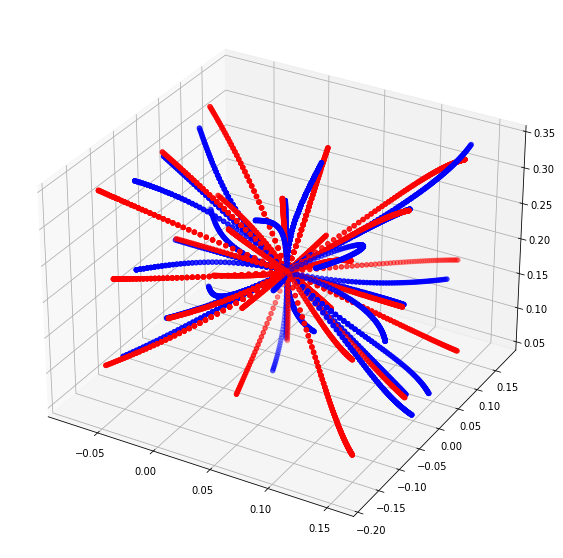

In [92]:
offline_evaluation(decoder)

## radiant-cosmos-456

KL = 0.01

In [93]:
decoder = ConditionalVAE.load_from_checkpoint('../latent-action/45gzl1q1/checkpoints/epoch=399-step=999999.ckpt')

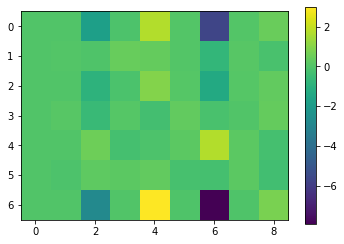

In [94]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

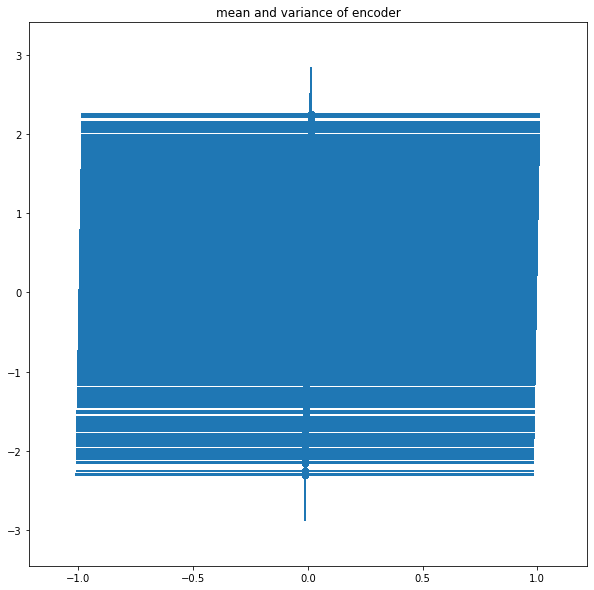

In [95]:
visualize_encoder(decoder)

{'x_min': -1.0132546, 'x_max': 1.0141997, 'y_min': -2.8811736, 'y_max': 2.8407004}


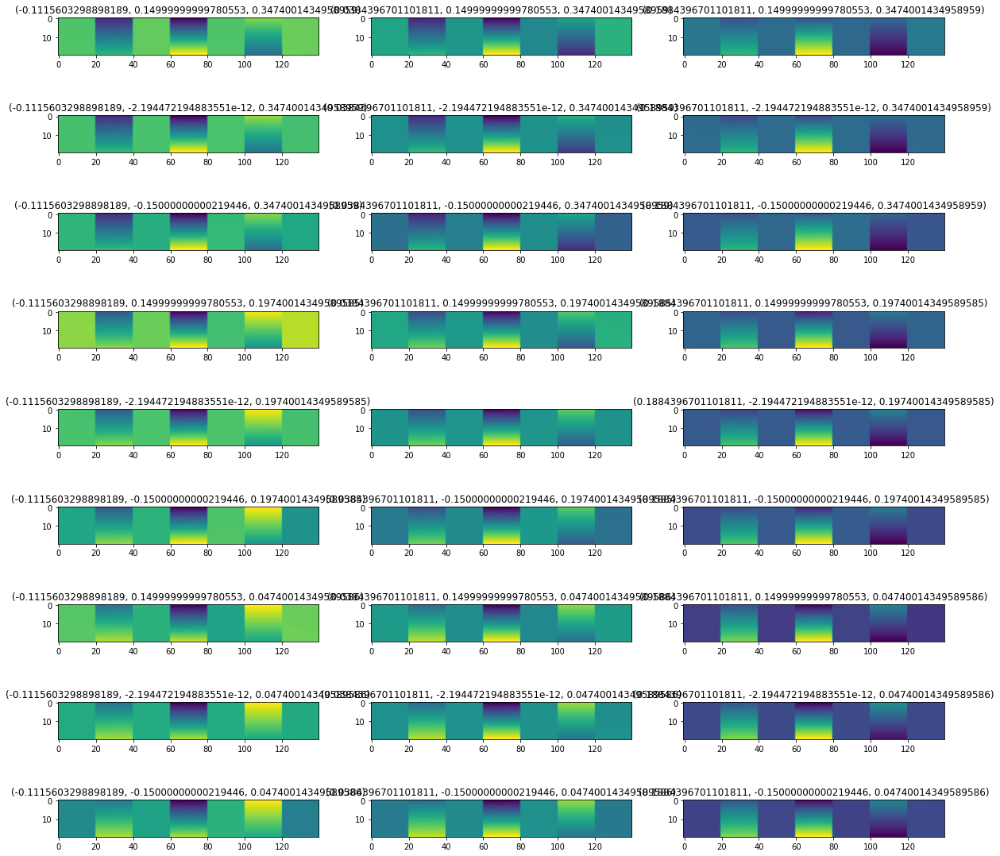

In [96]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

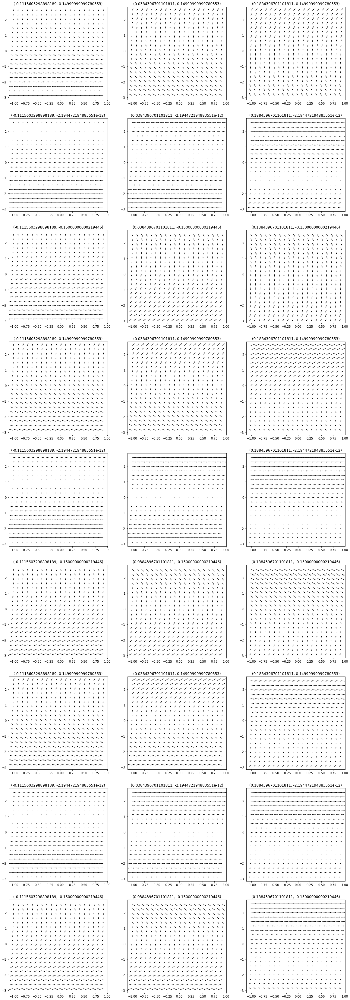

In [97]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

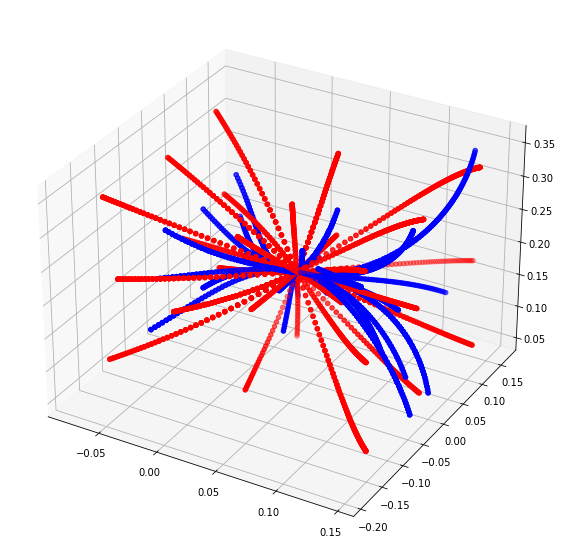

In [98]:
offline_evaluation(decoder)

## sleek-dawn-457

KL = 0.1

In [99]:
decoder = ConditionalVAE.load_from_checkpoint('../latent-action/2vf8fnan/checkpoints/epoch=399-step=999999.ckpt')

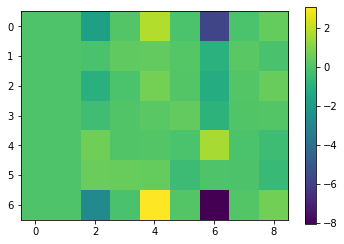

In [100]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

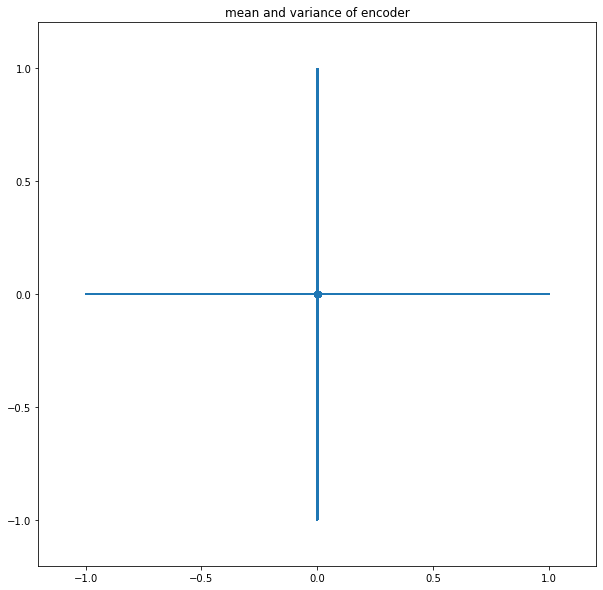

In [101]:
visualize_encoder(decoder)

{'x_min': -1.0025407, 'x_max': 1.0031805, 'y_min': -1.0006083, 'y_max': 1.0013493}


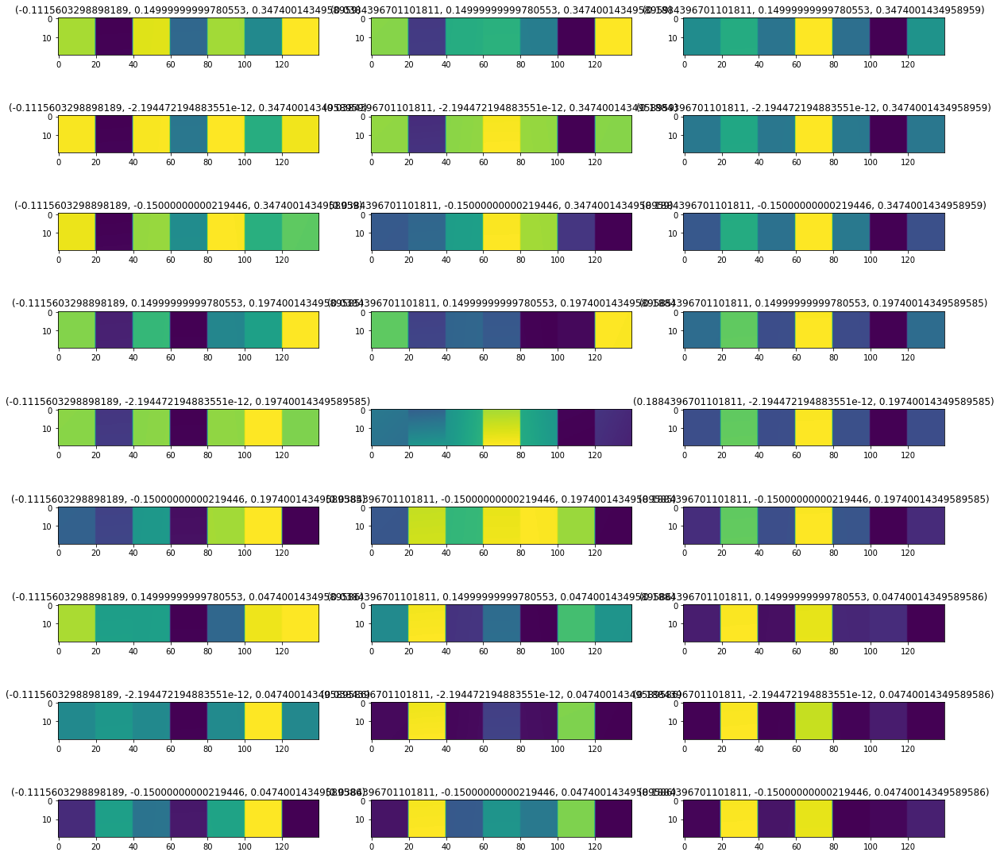

In [102]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

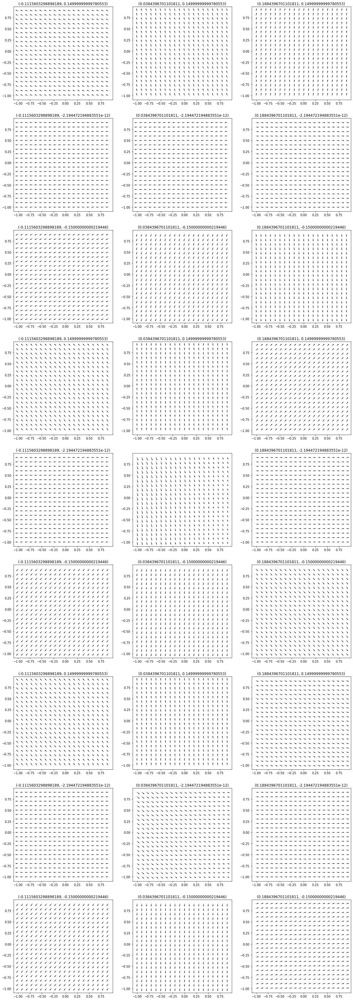

In [103]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

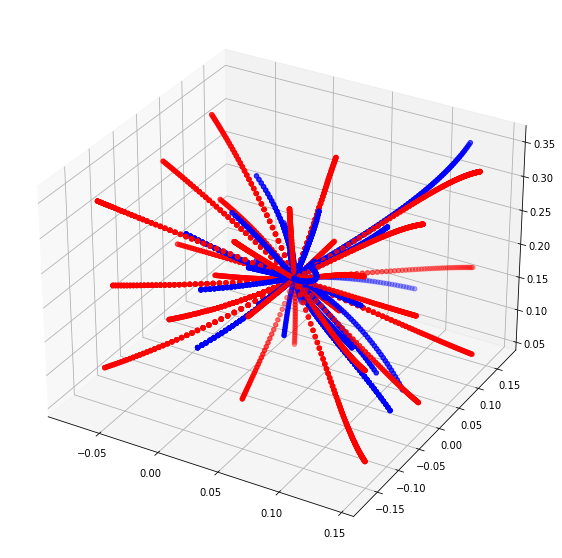

In [104]:
offline_evaluation(decoder)

## azure-jazz-458

KL = 1

In [105]:
decoder = ConditionalVAE.load_from_checkpoint('../latent-action/2s5o844u/checkpoints/epoch=399-step=999999.ckpt')

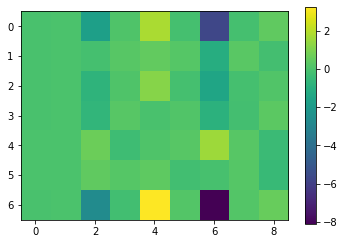

In [106]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

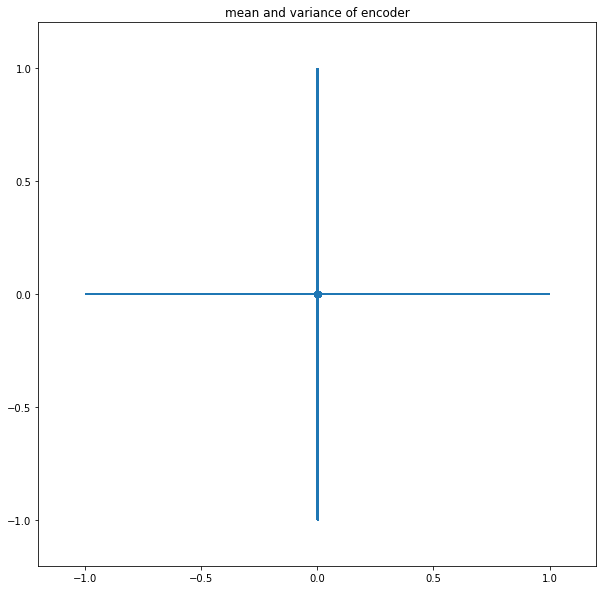

In [107]:
visualize_encoder(decoder)

{'x_min': -1.0008271, 'x_max': 1.0014595, 'y_min': -1.0006206, 'y_max': 1.0005355}


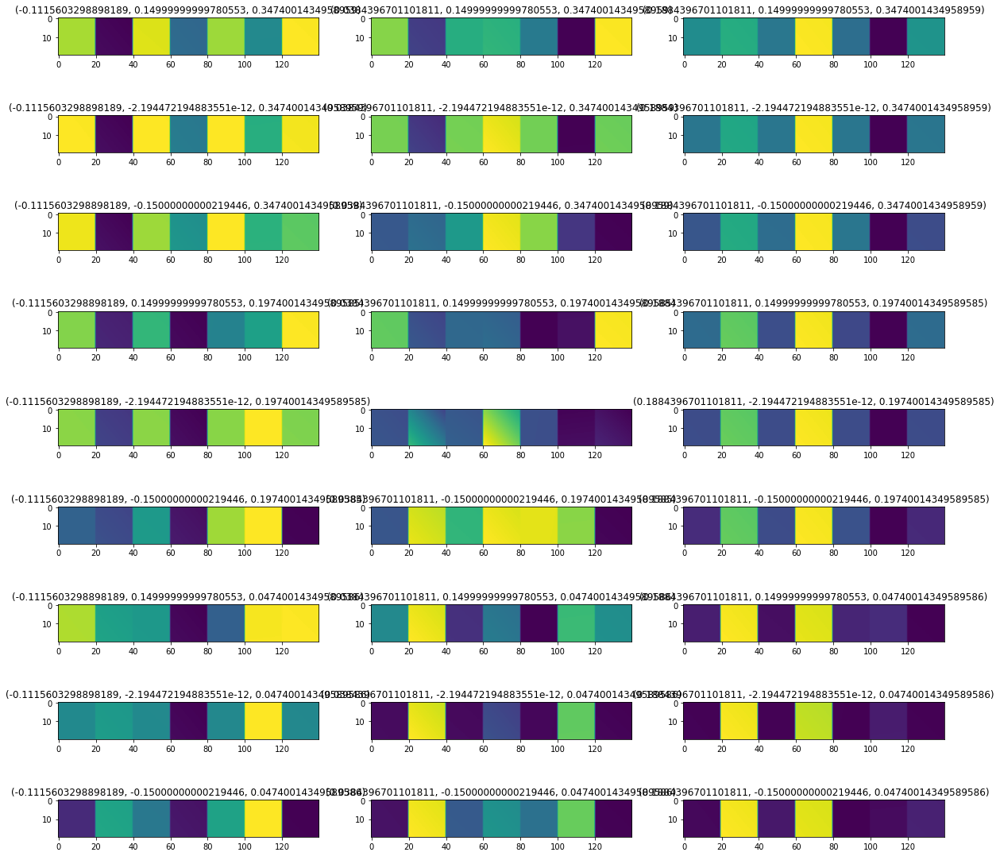

In [108]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

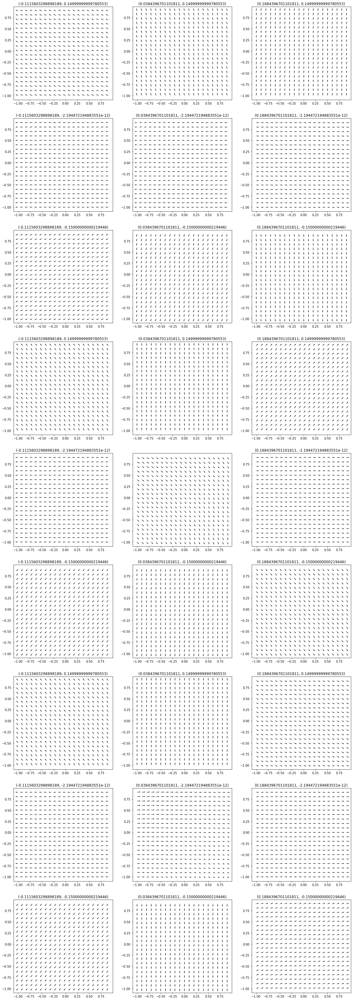

In [109]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

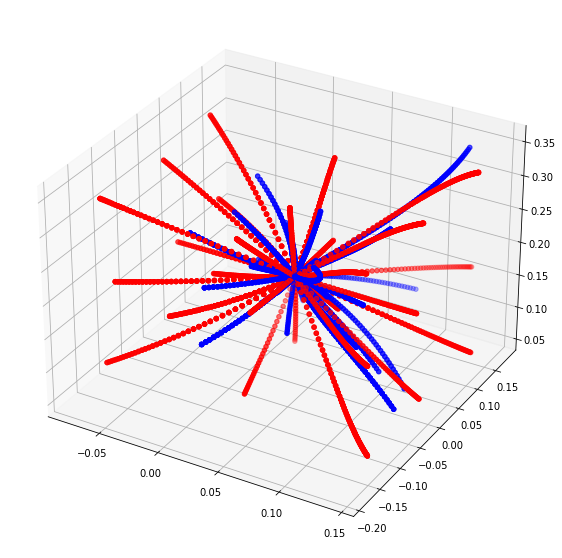

In [110]:
offline_evaluation(decoder)